# Retirement Planner

---

## Environment Setup

In [71]:
# Import libraries and dependencies
import numpy as np
import pandas as pd
import os
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import alpaca_trade_api as tradeapi
%matplotlib inline

In [72]:
# Set the random seed for resutls reproducibility (for testing purposes only)
np.random.seed(42)

---

## Portfolio Planner

In this activity, you will use the Alpaca API to grab historical data for a `60/40` portfolio using `SPY` to represent the stock portion and `AGG` to represent the bonds.

In [73]:
# Load .env enviroment variables
from dotenv import load_dotenv
load_dotenv()

# Set Alpaca API key and secret
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

# Create the Alpaca API object
api = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    api_version="v2")

# Data Collection

In this step, you will need to use the Alpaca api to fetch closing prices for the `SPY` and `AGG` tickers. Save the results as a pandas DataFrame

In [74]:
# Subset your tickers, then pull returns data:
# Set the ticker
ticker = ["SPY", "AGG"]

# Set timeframe to '1D'
timeframe = "1D"

# Set start and end datetimes of 1 year, between now and 365 days ago.
start_date = pd.Timestamp('2019-01-01', tz='America/New_York').isoformat()
end_date = pd.Timestamp('2019-12-31', tz='America/New_York').isoformat()

# Get 1 year's worth of historical data for SPY and AGG
df = api.get_barset(
    ticker,
    timeframe,
    limit=None,
    start=start_date,
    end=end_date,
    after=None,
    until=None,
).df

# Drop unnecessary columns
df = df.drop(
    columns=['open', 'high', 'low', 'volume'],
    level=1
)
df.index = df.index.date

In [75]:
# Display sample data
df

,AGG,SPY
,close,close
2019-01-02,106.585,249.89
2019-01-03,107.020,244.46
2019-01-04,106.695,252.41
2019-01-07,106.470,254.40
2019-01-08,106.420,256.65
...,...,...
2019-12-24,112.375,321.26
2019-12-26,112.480,322.91
2019-12-27,112.620,322.86


---

## Monte Carlo Simulation

In this step, you will run Monte Carlo Simulations for your portfolio to model portfolio performance at different retirement ages. 

Complete the following steps:

1. Calculate the daily returns for the SPY and AGG closing prices.

2. Calculate volatility for both the SPY and AGG closing prices.

3. Find the last day's closing price for both stocks and save those as variables

4. Run a Monte Carlo Simulation of at least `100` iterations and generate at least `30` years of closing prices

**Hint:** There are `252` trading days per year, so the number of records to generate for each Monte Carlo run will be `252 days * 30 years`.

In [76]:
# Calculate the daily roi for the stocks
daily_returns = df.pct_change()
# Display sample data
daily_returns.head()

,AGG,SPY
,close,close
2019-01-02,NaN,NaN
2019-01-03,0.004081,-0.021730
2019-01-04,-0.003037,0.032521
2019-01-07,-0.002109,0.007884
2019-01-08,-0.000470,0.008844


In [77]:
# Compute daily volatility
average_daily_returns_agg = daily_returns.mean()["AGG"]["close"]
average_daily_returns_spy = daily_returns.mean()["SPY"]["close"]
print(average_daily_returns_agg)
print(average_daily_returns_spy)

std_dev_daily_returns_agg = daily_returns.std()["AGG"]["close"]
std_dev_daily_returns_spy = daily_returns.std()["SPY"]["close"]
print(std_dev_daily_returns_agg)
print(std_dev_daily_returns_spy)

0.00021277231473764173
0.0010401250682146959
0.002089826211646555
0.007820053413439366


In [78]:
# Save the last day's closing price
agg_last_price = df["AGG"]["close"][-1]
spy_last_price = df["SPY"]["close"][-1]
print(f"AGG last price: {agg_last_price} , SPY last price: {spy_last_price}")


AGG last price: 112.37 , SPY last price: 321.92


In [79]:
# Setup the Monte Carlo Parameters
num_simulations = 500
num_records = 252 * 5
monte_carlo = pd.DataFrame()
simulated_prices = pd.DataFrame()

In [80]:
# Run the Monte Carlo Simulation
for n in range(num_simulations):
    
    # Initialize the simulated prices list with the last closing price of `AGG` and `SPY`
    simulated_agg_prices = [agg_last_price]
    simulated_spy_prices = [spy_last_price]
    
    for i in range(num_records):
        # Calculate the simulated price using the last price within the list and append to the respective list
        simulated_agg_price = simulated_agg_prices[-1] * (1 + np.random.normal(average_daily_returns_agg,         std_dev_daily_returns_agg))
        simulated_agg_prices.append(simulated_agg_price)

        simulated_spy_price = simulated_spy_prices[-1] * (1+ np.random.normal(average_daily_returns_spy, std_dev_daily_returns_spy))
        simulated_spy_prices.append(simulated_spy_price)
                 
       
    
    # Append a simulated prices of each simulation to DataFrame
    simulated_prices["AGG"]= pd.Series(simulated_agg_prices)
    simulated_prices["SPY"]= pd.Series(simulated_spy_prices)

    # Calculate the daily returns of simulated prices
    simulated_daily_returns = simulated_prices.pct_change()

    # Set the portfolio weights 40%-AGG, 60%-SPY 
    weights =[0.2, 0.8]
    
    # Use the `dot` function with the weights to multiply weights with each column"s simulated daily returns
    portfolio_daily_returns = simulated_daily_returns.dot(weights)

    # Calculate the normalized, cumulative return series
    monte_carlo[n] = (1 + portfolio_daily_returns.fillna(0)).cumprod()

# Print records from the DataFrame
monte_carlo.tail()



,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
1256,4.573066,2.287320,2.062310,3.511989,2.445494,3.240796,4.980727,2.977724,2.138506,2.146355,...,1.894912,1.885179,2.421952,3.052336,2.071613,2.234351,2.163138,2.940045,3.217433,3.146543
1257,4.570821,2.297724,2.047908,3.526600,2.492222,3.232243,4.960175,2.967700,2.123546,2.157423,...,1.908920,1.891272,2.420659,3.034000,2.036723,2.237999,2.143599,2.933846,3.226424,3.178827
1258,4.583955,2.334839,2.053817,3.524189,2.483510,3.221116,4.973717,2.993020,2.133415,2.150272,...,1.885981,1.909434,2.408449,3.020582,2.025237,2.240018,2.135868,2.932987,3.238138,3.199809
1259,4.524485,2.328983,2.056543,3.502530,2.497413,3.213634,4.951206,2.974757,2.136589,2.150671,...,1.893624,1.904070,2.413511,3.005131,2.040970,2.254414,2.161888,2.926691,3.231717,3.191512
1260,4.503908,2.338184,2.054847,3.483335,2.507326,3.257758,4.903066,2.975171,2.130468,2.148456,...,1.908053,1.910295,2.425415,3.011407,2.020575,2.249980,2.186521,2.928825,3.249312,3.177254


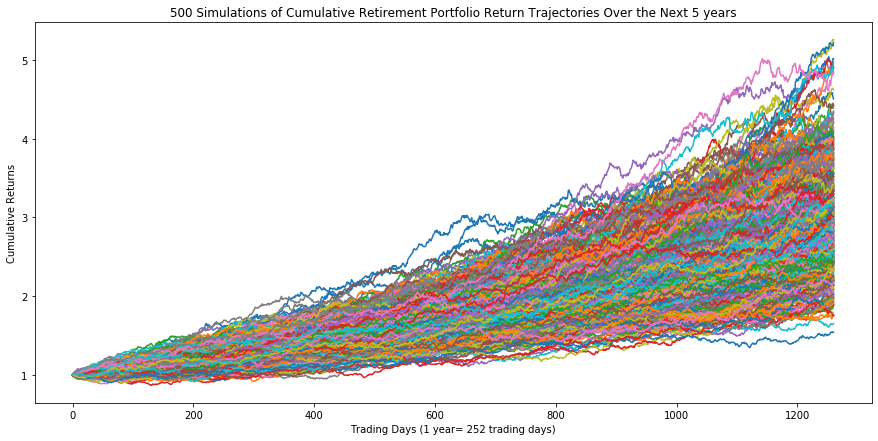

In [81]:
# Check that the simulation ran successfully & Visualize the Simulation
plot_title = f"{n+1} Simulations of Cumulative Retirement Portfolio Return Trajectories Over the Next 5 years"
monte_carlo_simulation = monte_carlo.plot(legend=None, title=plot_title, figsize=(15,7))
monte_carlo_simulation.set_xlabel("Trading Days (1 year= 252 trading days)")
monte_carlo_simulation.set_ylabel("Cumulative Returns")
monte_carlo_simulation

In [64]:
# Select the last row for the cumulative returns (cumulative returns at 20 years)
cumulative_returns_20 = monte_carlo.iloc[19, :]
cumulative_returns_20.tail()
cumulative_returns_20.min(), cumulative_returns_20.max()

(0.9588732722241143, 1.0702764119225385)

In [65]:
# Select the last row for the cumulative returns (cumulative returns at 30 years)
ending_cumulative_returns = monte_carlo.iloc[-1, :]
ending_cumulative_returns.min(), ending_cumulative_returns.max()

(1.4873495334182019, 3.6614990464842068)

0.05    1.810199
0.95    3.128352
Name: 1260, dtype: float64

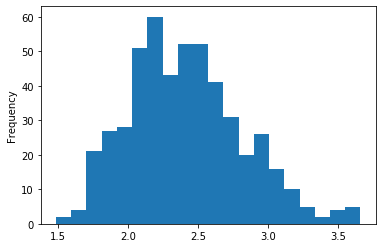

In [66]:
# Display the 90% confidence interval for the ending returns
ending_cumulative_returns.plot(kind="hist", bins=20)
ending_cumulative_returns.value_counts(bins=20) / len(ending_cumulative_returns)
confidence_interval = ending_cumulative_returns.quantile(q=[0.05, 0.95])
confidence_interval

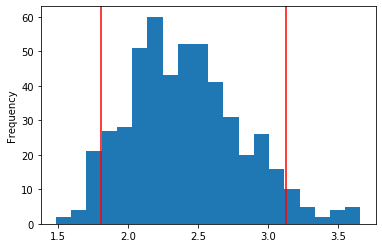

In [67]:
# Visualize the distribution of the ending returns
plt.figure();
ending_cumulative_returns.plot(kind="hist", bins=20)
plt.axvline(confidence_interval.iloc[0], color="r")
plt.axvline(confidence_interval.iloc[1], color="r")

---

## Retirement Analysis

In this section, you will use the monte carlo model to answer the following retirement planning questions:

1. What are the expected cumulative returns at `30` years for the `10th`, `50th`, and `90th` percentiles?

2. Given an initial investment of `$20,000`, what is the expected return in dollars at the `10th`, `50th`, and `90th` percentiles?

3. Given the current projected annual income from the Plaid analysis, will a `4%` withdrawal rate meet or exceed that value at the `10th` percentile? Note: This is basically determining if retirement income is equivalent to current income.

4. How would a `50%` increase in the initial investment amount affect the `4%` retirement withdrawal? In other words, what happens if the initial investment had been bigger?

### What are the expected cumulative returns at 30 years for the 10th, 50th, and 90th percentiles?

In [68]:
# Compute cumulative returns
ending_cumulative_returns.quantile(q=[0.1, 0.5,0.9])

0.1    1.916150
0.5    2.388824
0.9    2.976568
Name: 1260, dtype: float64

### Given an initial investment of `$20,000`, what is the expected portfolio return in dollars at the 10th, 50th, and 90th percentiles?

In [69]:
# Set initial investment
initial_investment = 20000
# Compute expected portfolio return
final_return = round(ending_cumulative_returns.quantile(q=[0.1, 0.5,0.9])* initial_investment, 2)
final_return

0.1    38322.99
0.5    47776.47
0.9    59531.36
Name: 1260, dtype: float64

### Given the current projected annual income from the Plaid analysis, will a 4% withdraw rate from the retirement portfolio meet or exceed that value at the 10th percentile?

Note: This is effectively saying that 90% of the expected returns will be greater than the return at the 10th percentile, so this can help measure the uncertainty about having enough funds at retirement

In [62]:
# Set Plaid's projected income
projected_income = 6085
# Calculate the 4% withdrawal for the ending return as retirement income
retirement_income = .04 * (ending_cumulative_returns.quantile(.1)* initial_investment)
# Determine if the retirement income meets or exceeds the current projected income
retirement_income

1532.9196009491666

Since the retirement income is more than the projected income of 6085, the portfolio meets the income expectations

 

### How would a 50% increase in the initial investment amount affect the 4% retirement withdrawal?

In [70]:
# Re-calculate the retirement income with a 50% increase in the initial investment amount
retirement_income = .04 * (ending_cumulative_returns.quantile(.1)* (initial_investment*1.5))
retirement_income

2299.37940142375

### Optional Challenge

Use the Monte Carlo data and calculate the cumulative returns at the `5%`, `50%`, and `95%` quartiles and plot this data as a line chart to see how the cumulative returns change over the life of the investment.

In this section, you need to calculate and plot the cumulative returns for the median and `90%` confidence intervals. This plot shows the expected cumulative returns for any given day between the first day and the last day of investment. 

In [191]:
# Compute projected returns
returns_5 = []
returns_50 = []
returns_95 = []
new_returns = pd.DataFrame()

for x in range(num_records):
    cumulative_returns_5 = monte_carlo.iloc[x].quantile(.05)
    returns_5.append(cumulative_returns_5)

    cumulative_returns_50 = monte_carlo.iloc[x].quantile(.50)
    returns_50.append(cumulative_returns_50)

    cumulative_returns_95 = monte_carlo.iloc[x].quantile(.95)
    returns_95.append(cumulative_returns_95)
# Display sample data
new_returns["0.05 Quartile"] = pd.Series(returns_5)
new_returns["0.50 Quartile"] = pd.Series(returns_50)
new_returns["0.95 Quartile"] = pd.Series(returns_95)

# Print bottom records of cumulative returns data frame
new_returns.tail()

,0.05 Quartile,0.50 Quartile,0.95 Quartile
7555,103.417679,197.529554,381.629617
7556,103.646181,198.046067,382.125745
7557,103.048930,198.571688,381.218333
7558,103.123992,198.582408,380.240758
7559,102.888323,199.404147,379.940198


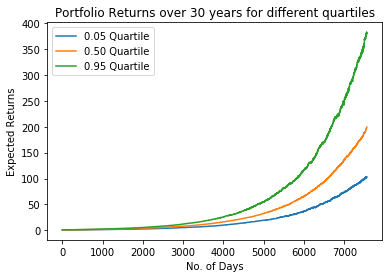

In [192]:
# Plot the cumulative returns over time
cumulative_returns = new_returns.plot(title="Portfolio Returns over 30 years for different quartiles")
cumulative_returns.set_xlabel("No. of Days")
cumulative_returns.set_ylabel("Expected Returns")

# Plot projected performance over time
cumulative_returns